In [ ]:
%%capture
%load_ext autoreload
%autoreload 2
from antarctic_plots import maps, utils, fetch, regions, profile
import pygmt
import pandas as pd
import numpy as np
import pyogrio

: 

## Create basemap

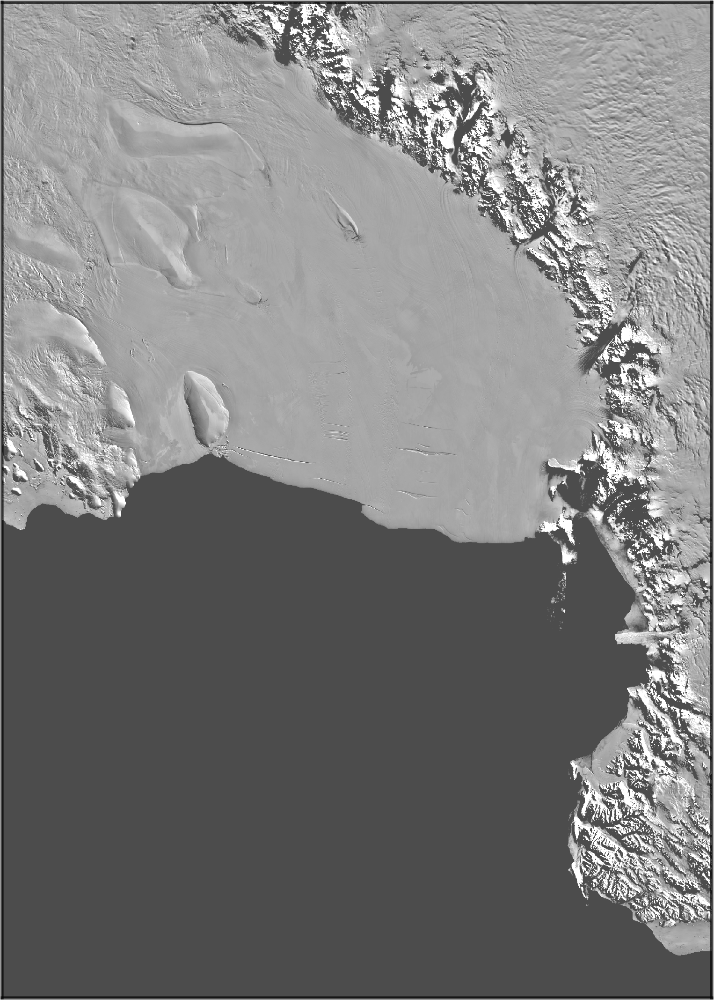

In [44]:
# define region to plot
# in EPSG:3031 meters [east, west, north, south]
reg = [-740e3, 580e3, -2200e3, -350e3]

# define projection and figure parameters
proj, proj_latlon, fig_width, fig_height = utils.set_proj(reg, fig_height=18)

# fetch MODIS MoA imagery for a background
moa = fetch.modis_moa(version=750)

fig=pygmt.Figure()

pygmt.makecpt(
    series = '15000/17000/1', 
    cmap = 'gray', 
    continuous = True
)
fig.grdimage(
    region = reg, 
    projection = proj, 
    frame = ["nwse", "g0"],  
    grid = moa, 
    cmap = True,
    transparency=30
)

fig.show()

## Add basement

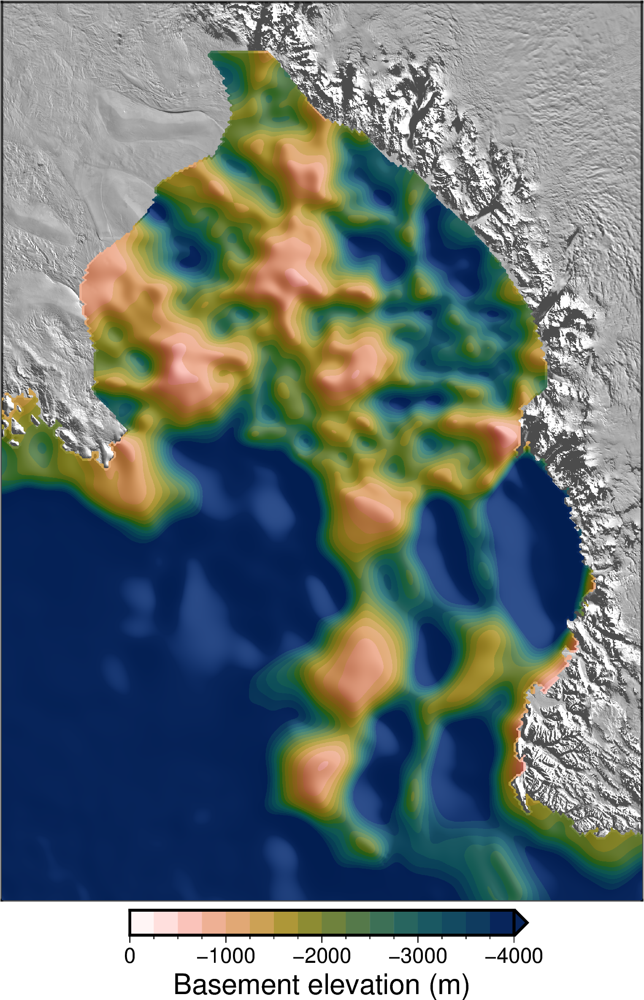

In [45]:
pygmt.makecpt(
    series = '-4000/0/17+n', 
    cmap='batlowW',
    background='o', 
    )

fig.grdimage(
    grid = fetch.basement(), 
    cmap = True, 
    shading="grdgradient+a45+ne.5+m-.2", 
    nan_transparent=True,
    dpi=500,
    )

# add colorbar
# pos_str = f'jBC+w{fig_width*.8}c+jTC+o0c/.6c+h+ml+e'
# with pygmt.config(
#     FONT_ANNOT_PRIMARY = '12p,black', 
#     FONT_LABEL = '16p,Helvetica-Bold,black', 
#     MAP_ANNOT_OFFSET_PRIMARY = '2p',
#     MAP_TICK_PEN_PRIMARY = '0.5p,black', 
#     MAP_TICK_LENGTH_PRIMARY = '3p', 
#     MAP_FRAME_PEN = '0.5p,black', 
#     MAP_LABEL_OFFSET = '4p',
#     ):
#     fig.colorbar(
#         cmap = True, 
#         position = pos_str, 
#         frame = ['xa1000f500+l"Basement elevation (m)"'], 
#         verbose='e',
#         )

pos_str = f'jBL+w{-fig_width*.6}c/.5c+jTL+o{(fig_width*.4)/2}c/.2c+h+eb'
with pygmt.config(
    FONT_ANNOT_PRIMARY = '12p,black', 
    FONT_LABEL = '16p,black'
    ):
    fig.colorbar(
        cmap= True, 
        position = pos_str, 
        frame=['xa1000f250+l"Basement elevation (m)"'], 
        verbose='e'
        )   

fig.show()

## Additional map elements

gmtset [WARNING]: Representation of font type not recognized. Using default.


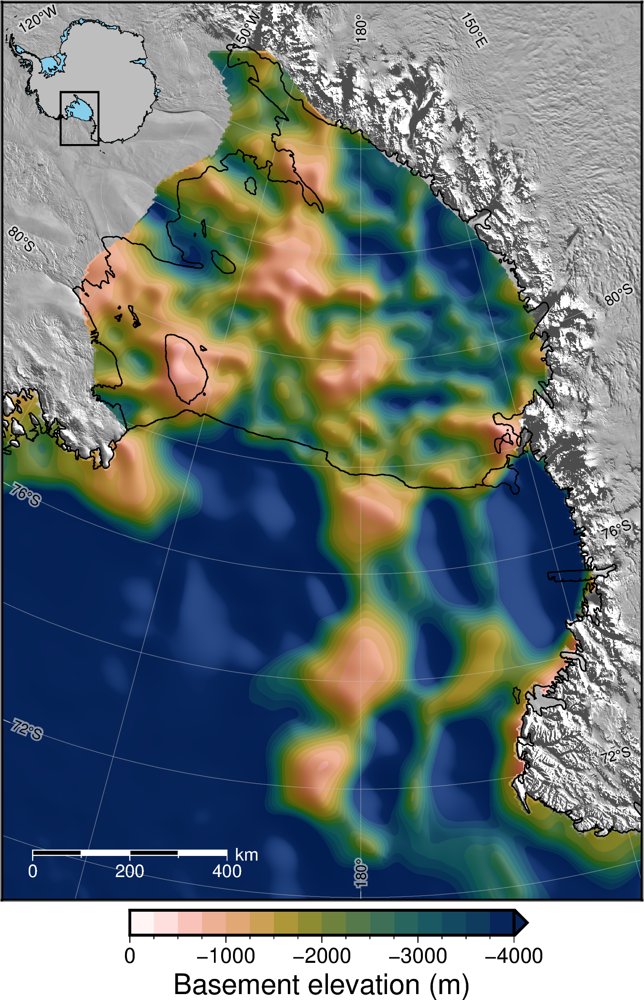

In [46]:
# add lat long grid lines
maps.add_gridlines(fig, reg, proj_latlon)

# add groundingline and coastline
maps.add_coast(fig, reg, proj)

# add scalebar
maps.add_scalebar(fig, reg, proj_latlon, 
    font_color='white', 
    scale_length='400',
    position='n.2/0.05', 
    )
    
# add inset map to show figure location
maps.add_inset(fig, reg, fig_width)

fig.show()

## Add profile location

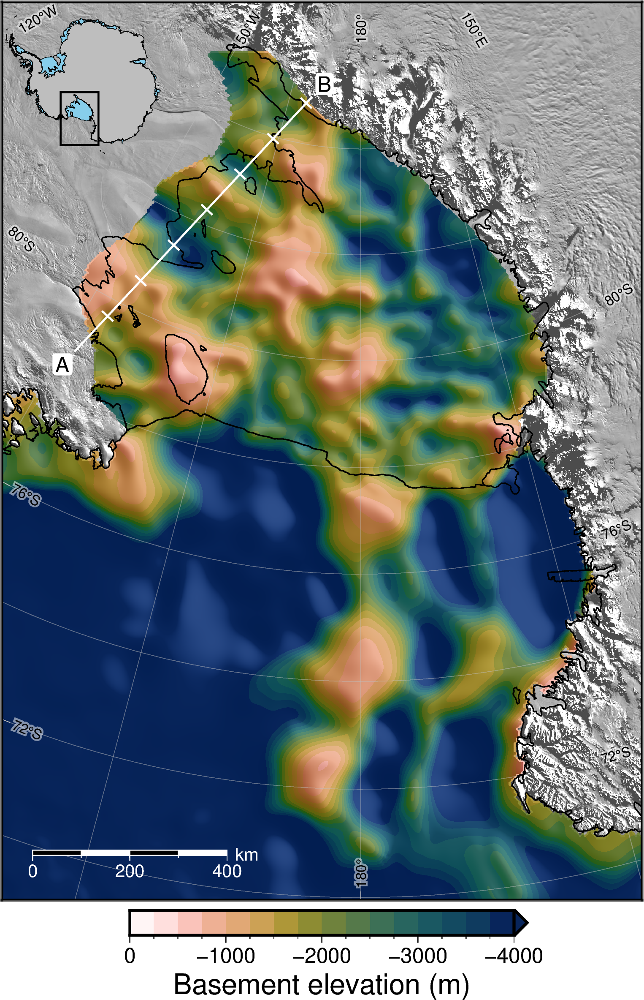

In [47]:
# # plot cross-section line and labels
a=(-590000,-1070000)
b=(-100000,-545000)

df = profile.create_profile(
    method = 'points',
    start = a,
    stop = b,
    num=1000,
)

# plot profile line with ticks every 100km
fig.plot(
        projection=proj, 
        region=reg, 
        x=df.x, 
        y=df.y, 
        pen='1p,white', 
        style='~d'+str(100/(float(proj[3:])/100000))+'c:+sy.3+p1p,white',
        )

fig.text(
        x = df.x.iloc[0],
        y = df.y.iloc[0], 
        text = "A",
        fill = 'white',
        font = '12p,Helvetica,black',
        offset = 'j.1/.1',
        justify="TR",
        clearance = '+tO',
        )

fig.text(
        x = df.x.iloc[-1],
        y = df.y.iloc[-1], 
        text = "B",
        fill = 'white',
        font = '12p,Helvetica,black',
        offset = 'j.1/.1',
        justify='BL',
        clearance = '+tO',
        )

fig.show()

## Add location labels and OIB lines

C:\Users\matthewt\AppData\Local\Temp\ipykernel_20156\430200277.py:32: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  df_OIB_lines.drop(df_OIB_lines.columns.difference(['x','y','Line']),1, inplace=True)


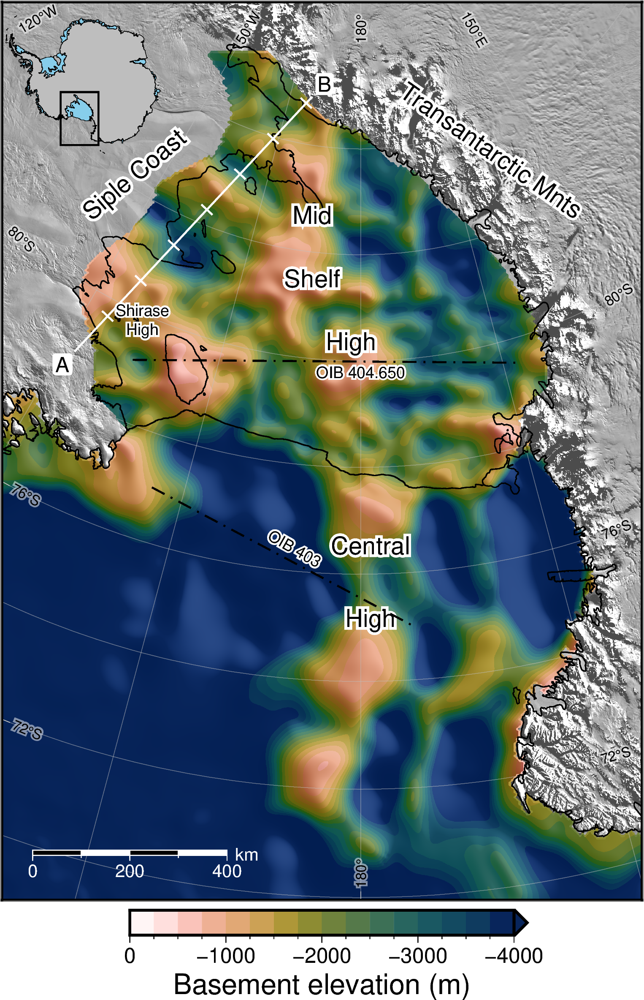

In [48]:
# plot text
fig.text(
    textfiles="place_labels_AGU_abstract.tsv",
    projection = proj,
    region=reg,
    angle=True,
    font='9,Helvetica,black,-=2p,white',
    justify=True,
    )     
fig.text(
    textfiles="place_labels_AGU_abstract.tsv",
    angle=True,
    font='9,Helvetica,black',
    justify=True,
    )  

fig.text(
    textfiles="AGU_poster_basement.tsv",
    angle=True,
    font= '14,Helvetica,black,-=3p,white',
    justify=True,
    )
fig.text(
    textfiles="AGU_poster_basement.tsv",
    angle=True,
    font= '14p,Helvetica,black',
    justify=True,
    )

# Plot OIB lines
df_OIB_lines = pd.read_csv('OIB_Lines.csv',header=0,index_col=None,sep=',')
df_OIB_lines.drop(df_OIB_lines.columns.difference(['x','y','Line']),1, inplace=True)
df_OIB_lines.dropna(inplace=True)
df_OIB_lines.columns =['Line','x','y']
first=df_OIB_lines.groupby('Line').nth(0)
last=df_OIB_lines.groupby('Line').nth(-1)
first.rename(columns={'x': 'x1', 'y': 'y1'}, inplace=True)
last.rename(columns={'x': 'x2', 'y': 'y2'}, inplace=True)
OIB_lines=pd.merge(first, last, on='Line')
fig.plot(x = (OIB_lines['x1'][403.1],OIB_lines['x2'][403.1]), 
         y = (OIB_lines['y1'][403.1],OIB_lines['y2'][403.1]), 
         pen = '1p,black,-.')
fig.plot(x = (OIB_lines['x1'][404.65],OIB_lines['x2'][404.65]), 
         y = (OIB_lines['y1'][404.65],OIB_lines['y2'][404.65]), 
         pen = '1p,black,-.')



fig.show()

In [49]:
# use interactive map to pick KIS1 location
# m = maps.interactive_map()

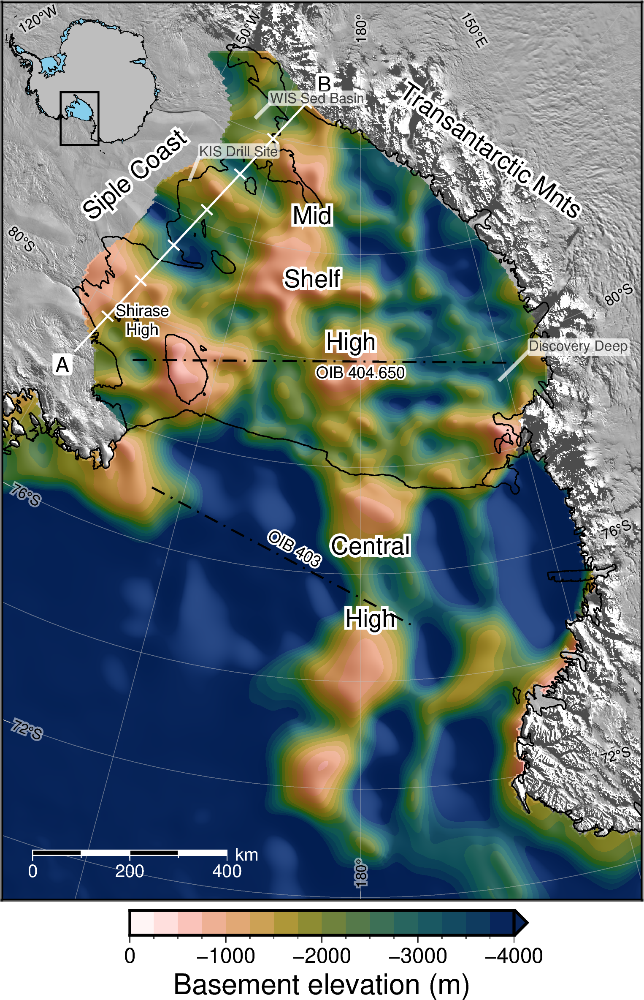

In [50]:
# plot SWAIS 2C KIS1 drill site
fig.text(x = -353280, y = -718848,
        text = 'KIS Drill Site',
        fill = 'white',
        font = "8,Helvetica,black",
        offset = '.2/0.5+v2p,white',
        transparency = '30',
        clearance = '+tO',
        justify = 'BL')

# plot Discovery Deep location
fig.text(x = 285000, y = -1130000, 
        text = 'Discovery Deep',
        fill = 'white',
        font = "8,Helvetica,black",
        offset = '.6/0.6+v2p,white',
        transparency = '30',
        clearance = '+tO',
        justify = 'BL')

# plot Whillans Basin Points from Gustafson et al. 2022
fig.text(x=-217457, y=-589312,
        text = 'WIS Sed Basin',
        fill = 'white',
        font = "8,Helvetica,black",
        offset = '.3/0.3+v2p,white',
        transparency = '30',
        clearance = '+tO',
        justify = 'BL')

fig.show()